Предсказать по фото человека его пол, расу и возраст.

Датасет, который мы будем использовать состоит из 20000 фотографий лиц людей в возрасте от 0 до 116 лет! В качестве разметки имеется пол (male/female), раса (white/black/asian/indian/other) и возраст.

Возьмем за основу сеть, которая была обучена на датасете VGGFace2 для классификации лиц. Он содержит 3.3 миллиона изображений с 9000 разными персоналиями.


## Загрузка библиотек и обученной модели

In [ ]:
# Установка библиотек
! pip install gdown
! pip install git+https://github.com/rcmalli/keras-vggface.git
! pip install keras_applications --no-deps
! pip install livelossplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-4o3h622h
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-4o3h622h
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
filename = "/usr/local/lib/python3.7/dist-packages/keras_vggface/models.py"
text = open(filename).read()
open(filename, "w+").write(text.replace('keras.engine.topology', 'tensorflow.keras.utils'))


from keras_vggface.vggface import VGGFace
from keras_vggface import utils
from keras.models import load_model

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense
import gdown

from collections import Counter
from livelossplot import PlotLossesKeras

Загрузим модель, посмотрим на архитектуру

In [ ]:
vggface_model = VGGFace(model='resnet50') # или model='resnet50' SENET50

In [ ]:
vggface_model.summary() 

Model: "vggface_resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                  

**Последний слой классифицирует на 8631 классов**

In [ ]:
# ! wget https://img.joinfo.ua/i/2019/01/5c4ea940d2b08.jpg -O brad_pitt.jpg

1359872/1346516 [==============================] - 0s 0us/step


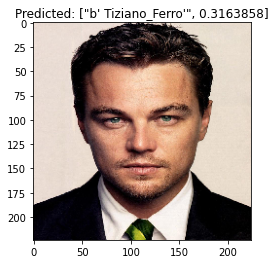

In [ ]:
img = image.load_img("/content/leod.jpeg", target_size=(224, 224)) # модель работает с картинками размера 224 на 224
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = utils.preprocess_input(x, version=2) # мы используем resnet50 -- поэтому version2

preds = vggface_model.predict(x)
plt.title(f"Predicted: {utils.decode_predictions(preds)[0][0]}") # decode_predictions из keras_vggface
plt.imshow(img)

Попробвал VGG16, senet50 и resnet50. Никто не знает ДиКаприо.

## Загрузка и подготовка данных 

In [ ]:
url = 'https://drive.google.com/uc?id=0BxYys69jI14kYVM3aVhKS1VhRUk'
output = '/tmp/UTKFace.tar.gz'
gdown.download(url, output, quiet=False)
! tar -xzf /tmp/UTKFace.tar.gz -C /tmp/
url = 'https://drive.google.com/uc?id=1mux7xiP4NP6AUUFvUW42RgSdUEQ4k5e2'
output = 'train_val_split_utk.csv'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=0BxYys69jI14kYVM3aVhKS1VhRUk
To: /tmp/UTKFace.tar.gz
100%|██████████| 107M/107M [00:00<00:00, 136MB/s]
Downloading...
From: https://drive.google.com/uc?id=1mux7xiP4NP6AUUFvUW42RgSdUEQ4k5e2
To: /content/train_val_split_utk.csv
100%|██████████| 1.08M/1.08M [00:00<00:00, 33.4MB/s]


'train_val_split_utk.csv'

In [ ]:
data_folder = Path("/tmp/UTKFace/")
filenames = list(map(lambda x: x.name, data_folder.glob('*.jpg')))
print(len(filenames))
print(filenames[:3]) # имя файла содержит возраст, индекс пола и расы, перечисленные через нижнее подчеркивание

23708
['30_0_2_20170116165112157.jpg.chip.jpg', '23_1_1_20170114030249007.jpg.chip.jpg', '28_1_3_20170119204506255.jpg.chip.jpg']


In [ ]:
# формируем датафрейм с путями и нужными классами
np.random.seed(10)
np.random.shuffle(filenames)
gender_mapping = {0: 'Male', 1: 'Female'}
race_mapping = dict(list(enumerate(('White', 'Black', 'Asian', 'Indian', 'Others'))))
age_labels, gender_labels, race_labels, correct_filenames = [], [], [], []

for filename in filenames:
    if len(filename.split('_')) != 4:
        print(f"Bad filename {filename}")
        continue

    age, gender, race, _ = filename.split('_')
    correct_filenames.append(filename)
    age_labels.append(age)
    gender_labels.append(gender)
    race_labels.append(race)
    
age_labels = np.array(age_labels, dtype=np.float32)
max_age = age_labels.max()
data = {"img_name": correct_filenames, 
        "age": age_labels / max_age, # нормализуем возраст от 0 до 1
        "race": race_labels, 
        "gender": gender_labels}
df = pd.DataFrame(data)
df.head()

Bad filename 61_1_20170109150557335.jpg.chip.jpg
Bad filename 39_1_20170116174525125.jpg.chip.jpg
Bad filename 61_1_20170109142408075.jpg.chip.jpg


,img_name,age,race,gender
0,45_0_3_20170119195652068.jpg.chip.jpg,0.387931,3,0
1,28_0_0_20170117202401886.jpg.chip.jpg,0.241379,0,0
2,8_1_3_20170104222705308.jpg.chip.jpg,0.068966,3,1
3,3_0_0_20170110213048070.jpg.chip.jpg,0.025862,0,0
4,26_1_2_20170116184701683.jpg.chip.jpg,0.224138,2,1


In [ ]:
df_split = pd.read_csv("train_val_split_utk.csv", index_col=0).set_index("img_name")
df_split.head()
df = df.set_index("img_name").join(df_split).reset_index()
df_train = df[df["is_train"] == 1]
df_val = df[df["is_train"] != 1]
print(len(df_val), len(df_train))

4759 18946


In [ ]:
def decode_labels(race_id, gender_id, age):
    return race_mapping[int(race_id)], gender_mapping[int(gender_id)], int(age*max_age)
def show_face(image, race_id, gender_id, age):
    plt.imshow(image)
    race, gender, age = decode_labels(race_id, gender_id, age)
    plt.title(f"Gender: {gender}, Race: {race}, Age: {age}")

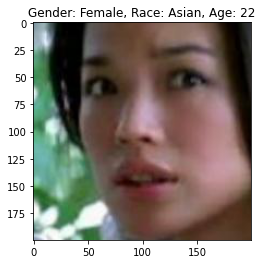

In [ ]:
row = df.iloc[np.random.randint(len(df))]
img = plt.imread(str(data_folder / row["img_name"]))
show_face(img, row["race"], row["gender"], row["age"])

Counter({'White': 10078, 'Black': 4526, 'Indian': 3975, 'Asian': 3434, 'Others': 1692})
Counter({'Male': 12391, 'Female': 11314})


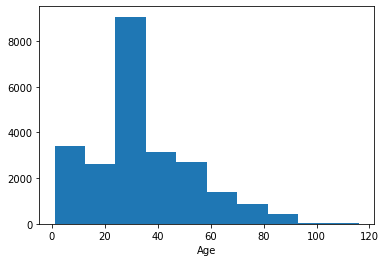

In [ ]:
races_verbose = [race_mapping[int(race)] for race in df["race"]]
genders_verbose = [gender_mapping[int(gender)] for gender in df["gender"]]

print(Counter(races_verbose))
print(Counter(genders_verbose))
_ = plt.hist(df["age"]*max_age)
_ = plt.xlabel("Age")

## **Генератор данных**

In [ ]:
def preprocess_input_facenet(image_):
    """
    image_ -- тензор размера (1, H, W, 3)
    
    return: картинка, с примененным preprocess_input(..., version=2) из keras_vggface (см пример с Бредом Питом)
    """

    
    preprocessed = utils.preprocess_input(image_, version=2)
    
    return preprocessed

# image_gen должен содержать ImageDataGenerator с правильной preprocessing_function

image_gen = ImageDataGenerator(preprocessing_function = preprocess_input_facenet)

In [ ]:
BATCH_SIZE = 128
IMAGE_SIZE = 224

In [ ]:
train_generator = image_gen.flow_from_dataframe(
    dataframe=df_train, # дф трейн или вал
    directory=str(data_folder), # директория
    x_col='img_name',
    y_col='gender',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    color_mode='rgb',
    class_mode='binary',
    batch_size=BATCH_SIZE,
    shuffle=True)

val_generator = image_gen.flow_from_dataframe(
    dataframe=df_val,
    directory=str(data_folder),
    x_col='img_name',
    y_col='gender',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    color_mode='rgb',
    class_mode='binary',
    batch_size=BATCH_SIZE,
    shuffle=False)

Found 18946 validated image filenames belonging to 2 classes.
Found 4759 validated image filenames belonging to 2 classes.


In [ ]:
# тесты

sample_images, sample_labels = next(val_generator)
assert sample_images.shape == (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3), "Неправильный размер батча"
assert sample_labels.shape == (BATCH_SIZE,), "Неправильный размер меток класса"
assert list(sorted(np.unique(sample_labels))) == [0., 1.], "Ожидаемые классы 0 и 1"
print("Simple tests passed")

Simple tests passed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Male


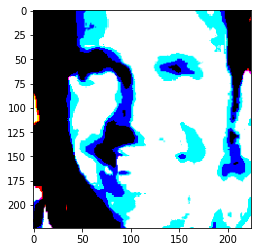

In [ ]:
# проверка соответствия лейбла
plt.imshow(sample_images[70])
print(gender_mapping[int(sample_labels[70])])

Выглядит странно, но это нормально

Male


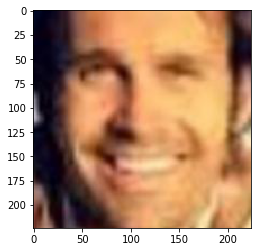

In [ ]:
def deprocess_image(vggface_image):
    """
    vggface_image -- (H, W, 3) картинка после препросессинга. 
    содержит отрицательные значения и некорректно отображается matplotlib

    return: корректно отображаеая картинка типа np.uint8(!!). 

    ! работайте с копией картинки (image = np.copy(vggface_image)) !
    """
    # < YOUR CODE STARTS HERE >
    
    image = np.copy(vggface_image)
    #image = image[..., ::-1]
    image[..., 0] += 91.4953
    image[..., 1] += 103.8827
    image[..., 2] += 131.0912
    image = image[..., ::-1].astype(np.uint8) 
  

    return image

# теперь картинка должна отображаться корректно
plt.imshow(deprocess_image(sample_images[70]))
print(gender_mapping[int(sample_labels[70])])

## Обучение модели, предсказание пола

In [ ]:
vggface_model.summary()

Model: "vggface_resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                  

In [ ]:
# для начала "отрежем" от vggface_model последний слой классификатора 
# теперь для картинки base_model предсказывает 2048-мерный вектор признаков.

base_model = tf.keras.Model([vggface_model.input], vggface_model.get_layer("flatten_1").output)
base_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                             

In [ ]:
base_model.trainable = False
model = tf.keras.Sequential([
                             base_model,
                             tf.keras.layers.Dense(128, activation="sigmoid"),
                             tf.keras.layers.Dense(64, activation="sigmoid"),
                             tf.keras.layers.Dense(1, activation="sigmoid")
                             ])
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer,
              loss="binary_crossentropy",
              metrics=["accuracy"])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 2048)              23561152  
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 23,831,745
Trainable params: 270,593
Non-trainable params: 23,561,152
_________________________________________________________________


In [ ]:
import datetime

In [ ]:
#"model_gender/checkpoint_best.h5"
path = Path("model_gender")
path.mkdir(exist_ok=True)
cpt_filename = "checkpoint_best.h5"
cpt_path =str(path / cpt_filename)

checkpoint = tf.keras.callbacks.ModelCheckpoint(cpt_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

model.fit(train_generator, epochs=20, validation_data=val_generator,
          callbacks=[tensorboard_callback, checkpoint], steps_per_epoch=25)

Epoch 1/20
25/25 [==============================] - ETA: 0s - loss: 0.6839 - accuracy: 0.6081
Epoch 1: val_accuracy improved from -inf to 0.79008, saving model to model_gender/checkpoint_best.h5
25/25 [==============================] - 34s 1s/step - loss: 0.6839 - accuracy: 0.6081 - val_loss: 0.6432 - val_accuracy: 0.7901
Epoch 2/20
25/25 [==============================] - ETA: 0s - loss: 0.6082 - accuracy: 0.8438
Epoch 2: val_accuracy improved from 0.79008 to 0.85648, saving model to model_gender/checkpoint_best.h5
25/25 [==============================] - 28s 1s/step - loss: 0.6082 - accuracy: 0.8438 - val_loss: 0.5703 - val_accuracy: 0.8565
Epoch 3/20
25/25 [==============================] - ETA: 0s - loss: 0.5271 - accuracy: 0.8900
Epoch 3: val_accuracy improved from 0.85648 to 0.88737, saving model to model_gender/checkpoint_best.h5
25/25 [==============================] - 29s 1s/step - loss: 0.5271 - accuracy: 0.8900 - val_loss: 0.4883 - val_accuracy: 0.8874
Epoch 4/20
25/25 [====

In [ ]:
# посмотрим что из себя представляет тензорборд
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
model_gender = load_model("model_gender/checkpoint_best.h5")
loss, acc = model_gender.evaluate(val_generator)

38/38 [==============================] - 14s 341ms/step - loss: 0.1700 - accuracy: 0.9393


In [ ]:
#вспомогательный код
def show_faces(images, real_race=None, real_gender=None, real_age=None, 
               predicted_race=None, predicted_gender=None, predicted_age=None):
    plt.figure(figsize=(10,10))
    labels = {"Gender": [predicted_gender, real_gender],
                  "Race": [predicted_race, real_race],
                  "Age": [predicted_age, real_age]}
    for i in range(16):
        plt.subplot(4,4, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(deprocess_image(images[i]))
        real_str = "Real:"
        pred_str = "Pred:"
        correct = True
        for name, (predicted, real) in labels.items():
            if predicted is None:
                continue
            if name == "Age":
                real_age = int(real[i]*int(max_age))
                predicted_age = int(predicted[i]*max_age)
                real_str += f"{real_age}"
                pred_str += f"{predicted_age}"
                if np.abs(predicted_age - real_age) > 6:
                    correct = False

            elif name == "Gender":
                real_gender = int(real[i])
                predicted_gender = int(predicted[i] > 0.5)
                real_str += f"{gender_mapping[real_gender]}, "
                pred_str += f"{gender_mapping[predicted_gender]}, "
                if real_gender != predicted_gender:
                    correct = False
            elif name == "Race":
                real_race = int(real[i])
                predicted_race = np.argmax(predicted[i])
                real_str += f"{race_mapping[real_race]}, "
                pred_str += f"{race_mapping[predicted_race]}, "
                if real_race != predicted_race:
                    correct = False
                
        title_obj = plt.title(f"{real_str}\n{pred_str}")
            
        plt.subplots_adjust(wspace=0.4)
        if not correct:
            plt.setp(title_obj, color='r')

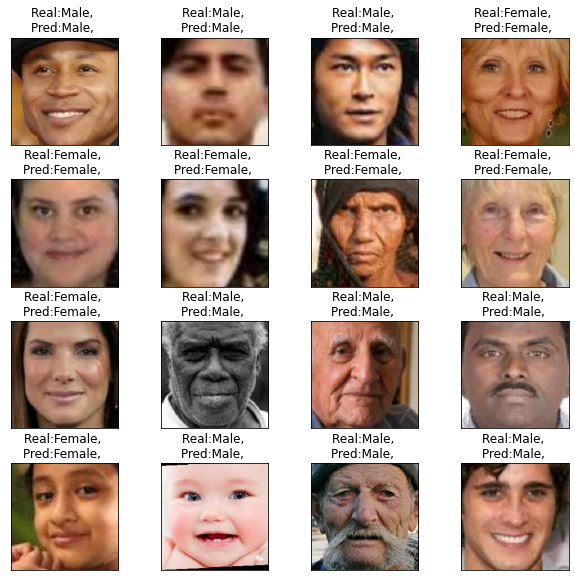

In [ ]:
sample_validation_images, sample_validation_labels = next(val_generator)
predicted = model_gender.predict(sample_validation_images)
show_faces(sample_validation_images, real_gender=sample_validation_labels, predicted_gender=predicted)

## Определение расы

In [ ]:
base_model.trainable = False
base_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                             

In [ ]:

model = tf.keras.Sequential([
                             base_model,
                             tf.keras.layers.Dense(64, activation="relu"),
                             tf.keras.layers.Dense(5, activation="sigmoid")
                             ])
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer,
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model (Functional)          (None, 2048)              23561152  
                                                                 
 dense_5 (Dense)             (None, 64)                131136    
                                                                 
 dense_6 (Dense)             (None, 5)                 325       
                                                                 
Total params: 23,692,613
Trainable params: 131,461
Non-trainable params: 23,561,152
_________________________________________________________________


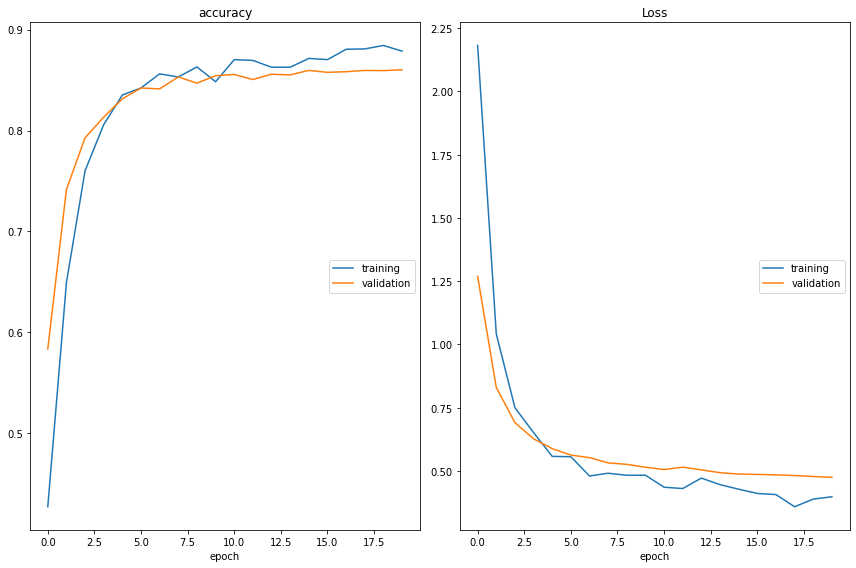

accuracy
	training         	 (min:    0.427, max:    0.884, cur:    0.879)
	validation       	 (min:    0.584, max:    0.860, cur:    0.860)
Loss
	training         	 (min:    0.359, max:    2.182, cur:    0.398)
	validation       	 (min:    0.475, max:    1.269, cur:    0.475)

Epoch 20: val_accuracy improved from 0.85963 to 0.86026, saving model to model_race/checkpoint_best.h5
25/25 [==============================] - 23s 937ms/step - loss: 0.3979 - accuracy: 0.8788 - val_loss: 0.4747 - val_accuracy: 0.8603


In [ ]:
# Обучение модели предсказания расы
train_generator = image_gen.flow_from_dataframe(
    dataframe=df_train,
    directory=str(data_folder),
    x_col='img_name',
    y_col='race',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    color_mode='rgb',
    class_mode='sparse',
    batch_size=BATCH_SIZE,
    shuffle=True)

val_generator = image_gen.flow_from_dataframe(
    dataframe=df_val,
    directory=str(data_folder),
    x_col='img_name',
    y_col='race',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    color_mode='rgb',
    class_mode='sparse',
    batch_size=BATCH_SIZE,
    shuffle=False)

#"model_race/checkpoint_best.h5"

path = Path("model_race")
path.mkdir(exist_ok=True)
cpt_filename = "checkpoint_best.h5"
cpt_path =str(path / cpt_filename)

checkpoint = tf.keras.callbacks.ModelCheckpoint(cpt_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')


model.fit(train_generator, epochs=20, validation_data=val_generator,
          callbacks=[PlotLossesKeras(), checkpoint], steps_per_epoch=25)

In [ ]:
model_race = load_model("model_race/checkpoint_best.h5")
loss, acc = model_race.evaluate(val_generator)


38/38 [==============================] - 14s 338ms/step - loss: 0.4747 - accuracy: 0.8603


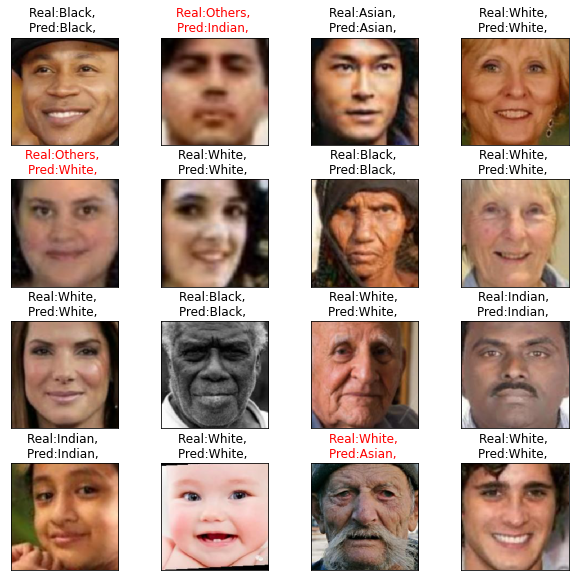

In [ ]:
sample_validation_images, sample_validation_labels = next(val_generator)
predicted = model_race.predict(sample_validation_images)
show_faces(sample_validation_images, real_race=sample_validation_labels, predicted_race=predicted)

## **Multitask learning**

In [ ]:
vggface_model = VGGFace(model='resnet50')
vggface_model.summary()

Model: "vggface_resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                  

In [ ]:

base_model = tf.keras.Model([vggface_model.input], vggface_model.get_layer("flatten_2").output)
base_model.trainable = False
base_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1/7x7_s2 (Conv2D)          (None, 112, 112, 64  9408        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv1/7x7_s2/bn (BatchNormaliz  (None, 112, 112, 64  256        ['conv1/7x7_s2[0][0]']           
 ation)                         )                                                           

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_1 (Functional)           (None, 2048)         23561152    ['input_4[0][0]']                
                                                                                                  
 generalizing_layer (Dense)     (None, 256)          524544      ['model_1[0][0]']                
                                                                                                  
 gender_layer_in (Dense)        (None, 256)          65792       ['generalizing_layer[0][0]'

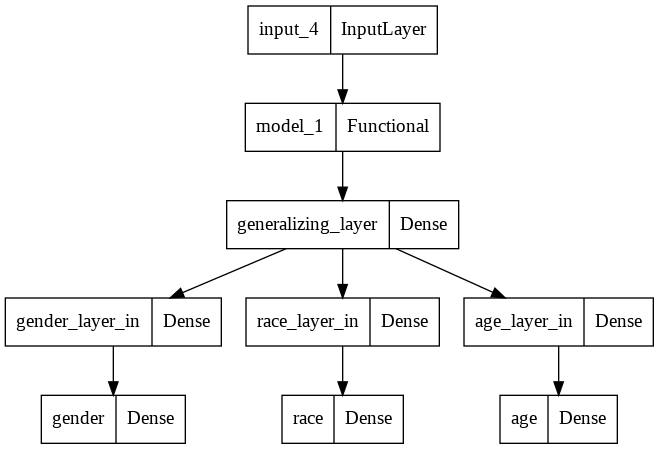

In [ ]:

input_layer = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# переменная model должна содержать модель для дальнейшего обучения

base_model_outputs = base_model(input_layer)
generalizing_dense_layer = Dense(256, activation="sigmoid", name="generalizing_layer")(base_model_outputs)

gender_layer_in = Dense(256, activation="sigmoid", name="gender_layer_in")(generalizing_dense_layer)
gender_layer_out = Dense(1, activation="sigmoid", name="gender")(gender_layer_in)

race_layer_in = Dense(256, activation="relu", name="race_layer_in")(generalizing_dense_layer)
race_layer_out = Dense(5, activation="sigmoid", name="race")(race_layer_in)

age_layer_in = Dense(256, activation="relu", name="age_layer_in")(generalizing_dense_layer)
age_layer_out = Dense(1, activation="sigmoid", name="age")(age_layer_in)

model = tf.keras.Model(inputs=input_layer, outputs=[gender_layer_out, race_layer_out, age_layer_out])

model.summary()
plot_model(model)

In [ ]:
prediction = model(np.zeros((6, IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.float32))
assert len(prediction) == 3, "Модель должна возвращать три тензора"
assert prediction[0].shape == (6, 1), f"Неправильный размер выхода gender: {prediction[0].shape}"
assert prediction[1].shape == (6, 5), f"Неправильный размер выхода race: {prediction[1].shape}"
assert prediction[2].shape == (6, 1), f"Неправильный размер выхода age: {prediction[2].shape}"
print("Shape tests passed")

Shape tests passed


In [ ]:
train_generator = image_gen.flow_from_dataframe(
        dataframe=df_train,
        class_mode="raw",
        x_col="img_name", y_col=["gender", "race", "age"], # нас интересуют все три столбца
        directory=str(data_folder),
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        shuffle=True)
val_generator = image_gen.flow_from_dataframe(
        dataframe=df_val,
        class_mode="raw", # мультивыход
        x_col="img_name", y_col=["gender", "race", "age"], 
        directory=str(data_folder),
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        shuffle=True)
def split_outputs(generator):
    """
    Вспомогательная функция, которая модернизирует генераторы картинок, чтобы их
    можно было использовать для Мultitask
    image_gen.flow_from_dataframe возвращает на каждой итерации батч:
    ((N, H, W, 3), (N, 3)) -- N картинок и N троек меток (для трех "задач")
    model.fit(..) ожидает генератор в формате:
    ((N, H, W, 3), [(N, 1), (N, 1), (N, 1)])

    Для такого превращения и нужна эта функция.

    """
    while True:
        data = next(generator)
        image = data[0]
        labels = np.split(data[1].astype("float32"), 3, axis=1)
        labels = [labels[0].reshape((len(labels[0]),)),
                  labels[1].reshape((len(labels[1]),)),
                  labels[2].reshape((len(labels[2]),))
                  ] 
        yield image, labels

Found 18946 validated image filenames.
Found 4759 validated image filenames.


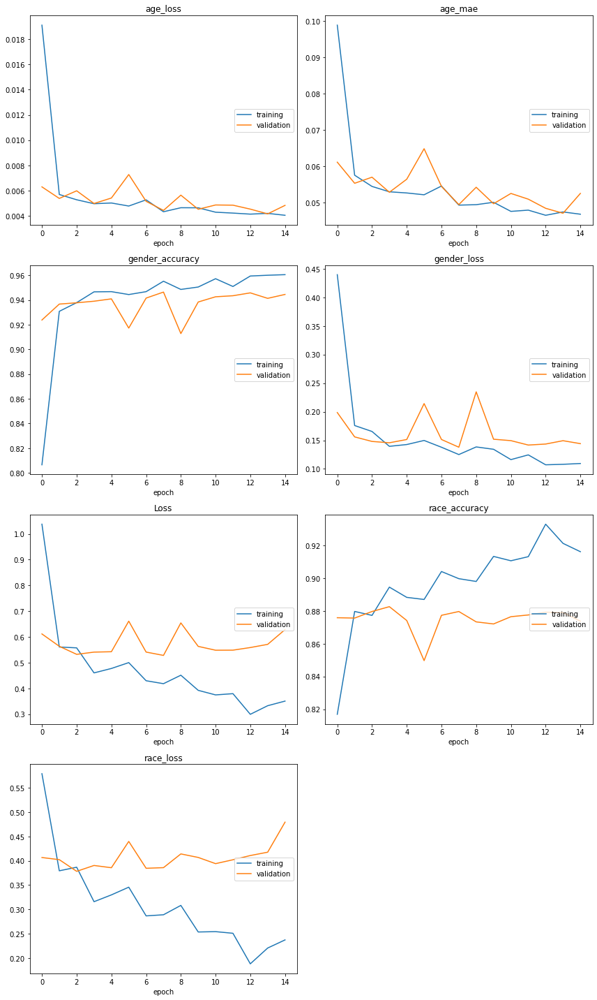

age_loss
	training         	 (min:    0.004, max:    0.019, cur:    0.004)
	validation       	 (min:    0.004, max:    0.007, cur:    0.005)
age_mae
	training         	 (min:    0.046, max:    0.099, cur:    0.047)
	validation       	 (min:    0.047, max:    0.065, cur:    0.053)
gender_accuracy
	training         	 (min:    0.807, max:    0.960, cur:    0.960)
	validation       	 (min:    0.913, max:    0.946, cur:    0.944)
gender_loss
	training         	 (min:    0.107, max:    0.440, cur:    0.109)
	validation       	 (min:    0.138, max:    0.235, cur:    0.144)
Loss
	training         	 (min:    0.299, max:    1.038, cur:    0.351)
	validation       	 (min:    0.528, max:    0.661, cur:    0.628)
race_accuracy
	training         	 (min:    0.817, max:    0.933, cur:    0.916)
	validation       	 (min:    0.850, max:    0.883, cur:    0.874)
race_loss
	training         	 (min:    0.188, max:    0.579, cur:    0.237)
	validation       	 (min:    0.378, max:    0.479, cur:    0.479)

E

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001) # вы можете выбрать другую скорость обучения для вашей модели

# обратите внимание, что теперь loss -- это словарь, в котором к каждому выходу мы "прицепляем" свой лосс
# аналогично с metrics
model.compile(optimizer=optimizer, 
              loss={'gender': 'binary_crossentropy', 'race': 'sparse_categorical_crossentropy', 'age': 'mse'},
              metrics={'gender': 'accuracy', 'race': 'accuracy', 'age': 'mae'})

path = Path("model_multitask")
path.mkdir(exist_ok=True)
cpt_filename = "checkpoint_best.h5"
cpt_path =str(path / cpt_filename)

checkpoint = tf.keras.callbacks.ModelCheckpoint(cpt_path, monitor='val_age_mae', verbose=1, save_best_only=True, mode='min')

model.fit(split_outputs(train_generator), epochs=15, validation_data=split_outputs(val_generator),
                    callbacks=[PlotLossesKeras(), checkpoint], steps_per_epoch=50, 
                    validation_steps= len(df_val) // BATCH_SIZE)

In [ ]:
model_multitask = load_model("model_multitask/checkpoint_best.h5")
val_generator = image_gen.flow_from_dataframe(
        dataframe=df_val,
        class_mode="raw",
        x_col="img_name", y_col=["gender", "race", "age"], 
        directory=str(data_folder),
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        shuffle=True)
results = model.evaluate(split_outputs(val_generator), steps=len(df_val)//BATCH_SIZE)
assert results[-3] > 0.90, f"Gender accuracy is too low. Please try to improve it {results[-3]}"
assert results[-2] > 0.80, f"Race accuracy is too low. Please try to improve it. {results[-2]}"
assert results[-1] < 0.09, f"Age MAE it too high: {results[-1]}"
print("Well done!")

Found 4759 validated image filenames.
37/37 [==============================] - 13s 348ms/step - loss: 0.6269 - gender_loss: 0.1442 - race_loss: 0.4779 - age_loss: 0.0048 - gender_accuracy: 0.9445 - race_accuracy: 0.8742 - age_mae: 0.0524
Well done!


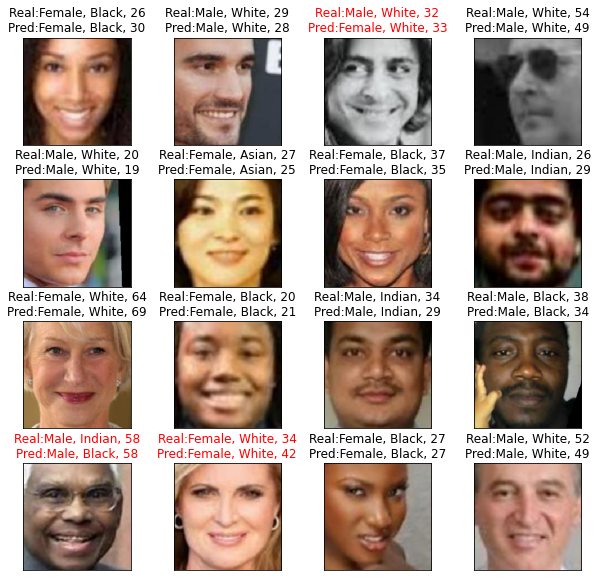

In [ ]:
sample_validation_images, sample_validation_labels = next(split_outputs(val_generator))
predicted = model_multitask.predict(sample_validation_images)
show_faces(sample_validation_images, 
           real_gender=sample_validation_labels[0], predicted_gender=predicted[0],
           real_race=sample_validation_labels[1], predicted_race=predicted[1],
           real_age=sample_validation_labels[2].flatten(), predicted_age=predicted[2].flatten(),
           )